# Problem 8

I don't recommend running much of this code as there are a lot of required dependencies and the stored results can be fragile. Image sets (both transfer learning and example plants) also not included in files.  

In [44]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import os
from PIL import Image
from torchvision import datasets, models, transforms
import numpy as np
import json
import requests
import matplotlib.pyplot as plt
import warnings
import time
import copy
warnings.filterwarnings('ignore')
%matplotlib inline

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")


Using cpu for inference


## Part A: Classifying Images Using EfficientNet Image Classification Algorithm

We load the pretrained EfficientNet model, run our images through, and print out the predicted results

Code modified from example code on the pytorch website found at https://pytorch.org/hub/nvidia_deeplearningexamples_efficientnet/

Using cache found in C:\Users\adhar/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub
Using cache found in C:\Users\adhar/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub


sample 0: [('stone wall', '71.3%'), ('cauliflower', '2.3%'), ('broccoli', '1.3%'), ('head cabbage', '1.0%'), ('doormat, welcome mat', '0.9%')]
sample 1: [('earthstar', '34.0%'), ('pot, flowerpot', '6.3%'), ('buckeye, horse chestnut, conker', '3.8%'), ('stinkhorn, carrion fungus', '3.2%'), ('wolf spider, hunting spider', '3.0%')]
sample 2: [('pot, flowerpot', '54.2%'), ('daisy', '1.1%'), ('whiptail, whiptail lizard', '0.5%'), ('hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa', '0.5%'), ('dung beetle', '0.5%')]
sample 3: [('pot, flowerpot', '24.8%'), ('hip, rose hip, rosehip', '24.6%'), ('buckeye, horse chestnut, conker', '5.4%'), ('stone wall', '2.4%'), ('earthstar', '2.0%')]
sample 4: [('hognose snake, puff adder, sand viper', '4.7%'), ('thunder snake, worm snake, Carphophis amoenus', '3.9%'), ('tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui', '3.2%'), ('armadillo', '2.7%'), ('common newt, Triturus vulgaris', '2.4%')]
sample 5: [('pot, flowerp

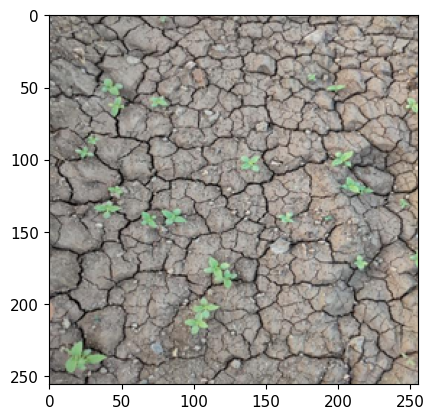

[('stone wall', '71.3%'), ('cauliflower', '2.3%'), ('broccoli', '1.3%'), ('head cabbage', '1.0%'), ('doormat, welcome mat', '0.9%')]


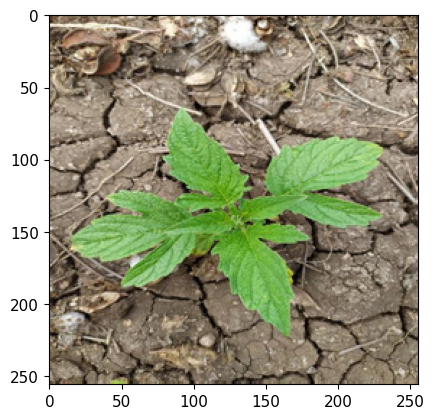

[('earthstar', '34.0%'), ('pot, flowerpot', '6.3%'), ('buckeye, horse chestnut, conker', '3.8%'), ('stinkhorn, carrion fungus', '3.2%'), ('wolf spider, hunting spider', '3.0%')]


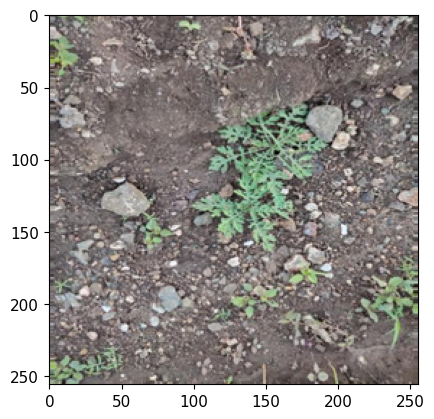

[('pot, flowerpot', '54.2%'), ('daisy', '1.1%'), ('whiptail, whiptail lizard', '0.5%'), ('hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa', '0.5%'), ('dung beetle', '0.5%')]


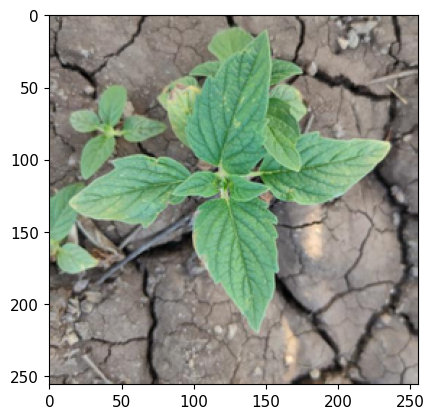

[('pot, flowerpot', '24.8%'), ('hip, rose hip, rosehip', '24.6%'), ('buckeye, horse chestnut, conker', '5.4%'), ('stone wall', '2.4%'), ('earthstar', '2.0%')]


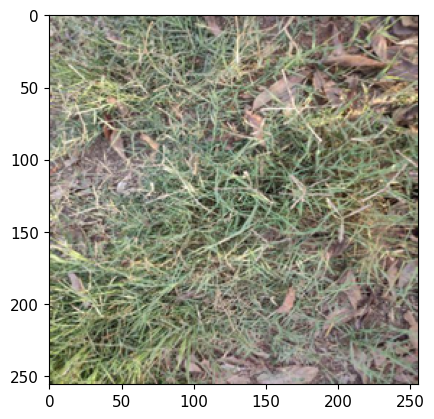

[('hognose snake, puff adder, sand viper', '4.7%'), ('thunder snake, worm snake, Carphophis amoenus', '3.9%'), ('tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui', '3.2%'), ('armadillo', '2.7%'), ('common newt, Triturus vulgaris', '2.4%')]


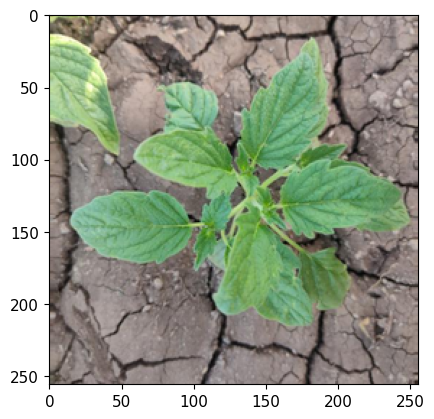

[('pot, flowerpot', '27.6%'), ('buckeye, horse chestnut, conker', '9.5%'), ('hip, rose hip, rosehip', '8.3%'), ('hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa', '3.3%'), ('cucumber, cuke', '2.6%')]


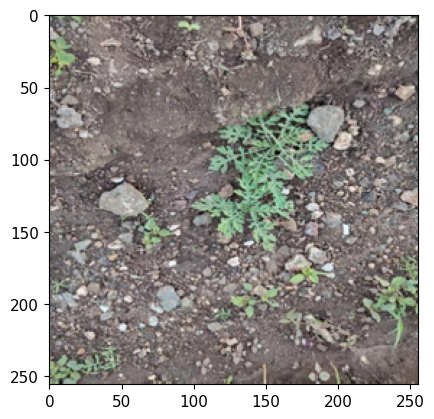

[('pot, flowerpot', '54.0%'), ('daisy', '1.1%'), ('whiptail, whiptail lizard', '0.7%'), ('dung beetle', '0.6%'), ('sidewinder, horned rattlesnake, Crotalus cerastes', '0.5%')]


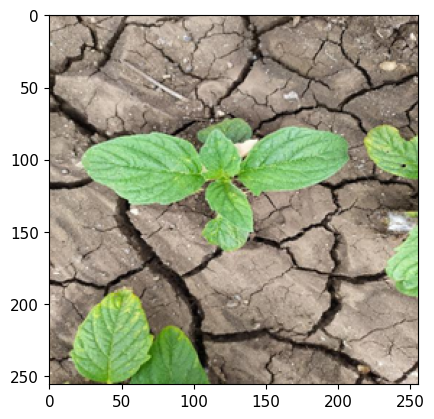

[('stone wall', '45.1%'), ('pot, flowerpot', '2.7%'), ('harvestman, daddy longlegs, Phalangium opilio', '2.4%'), ('chainlink fence', '2.4%'), ('hip, rose hip, rosehip', '2.0%')]


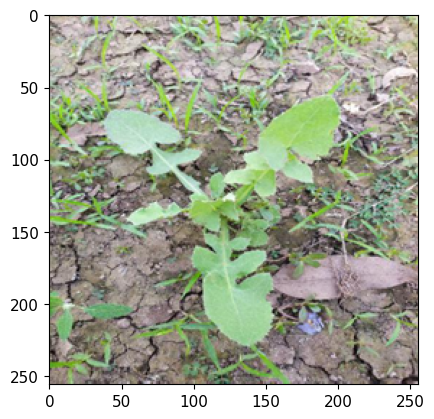

[('pot, flowerpot', '5.1%'), ('tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui', '5.0%'), ('hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa', '4.4%'), ('box turtle, box tortoise', '2.4%'), ('mud turtle', '2.3%')]


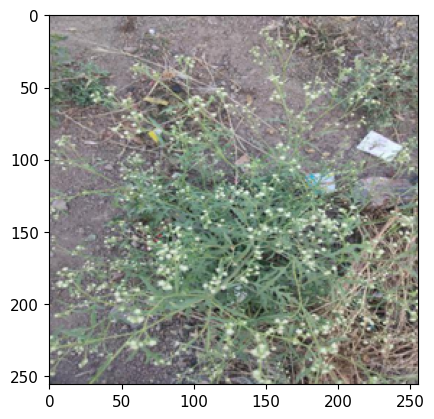

[('pot, flowerpot', '10.6%'), ('barrow, garden cart, lawn cart, wheelbarrow', '10.3%'), ("spider web, spider's web", '6.1%'), ('apiary, bee house', '4.2%'), ('park bench', '2.8%')]


In [45]:
efficientnet = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_efficientnet_b0', pretrained=True)
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_convnets_processing_utils')

efficientnet.eval().to(device)

images = []

for file in os.scandir("CropWeedImages"):
    images.append(file.path)

batch = torch.cat(
    [utils.prepare_input_from_uri(image) for image in images]
).to(device)

with torch.no_grad():
    output = torch.nn.functional.softmax(efficientnet(batch), dim=1)
    
results = utils.pick_n_best(predictions=output, n=5)

for image, result in zip(images, results):
    img = Image.open(image)
    img.thumbnail((256,256), Image.ANTIALIAS)
    plt.imshow(img)
    plt.show()
    print(result)

## Part B: Classifying Images Using YOLOv5 Ultralytics Image Classification Algorithm

We load the pretrained YOLOv5 Ultralytics model, run our images through, and print out the results according to detected objects. Images display bounding boxes around detected objects.

The YOLO algorithm differs from our previous algorithm in that it tries to pick objects out of an image and classify them each separately instead of looking at the image as a whole. It can find a lot more use than other image classification algorithms when looking at images containing multiple objects or objects that take up a smaller amount of the available space. 

Code modified from example code on the pytorch website found at https://pytorch.org/hub/ultralytics_yolov5/

Using cache found in C:\Users\adhar/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2022-10-31 Python-3.10.7 torch-1.12.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
image 1/10: 512x512 (no detections)
image 2/10: 512x512 (no detections)
image 3/10: 512x512 (no detections)
image 4/10: 512x512 (no detections)
image 5/10: 512x512 (no detections)
image 6/10: 512x512 1 bird
image 7/10: 512x512 (no detections)
image 8/10: 512x512 2 broccolis
image 9/10: 512x512 (no detections)
image 10/10: 512x512 (no detections)
Speed: 6.6ms pre-process, 193.2ms inference, 1.0ms NMS per image at shape (10, 3, 640, 640)


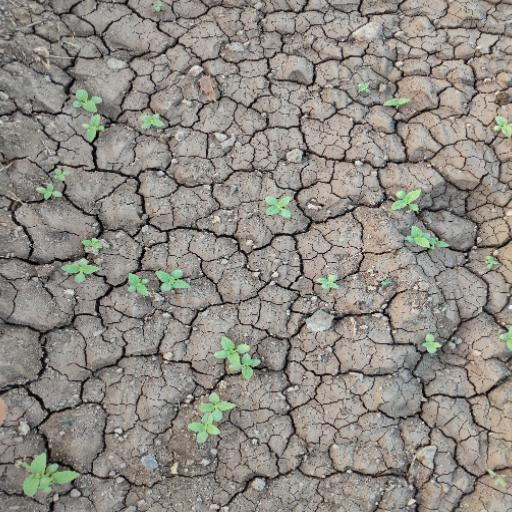

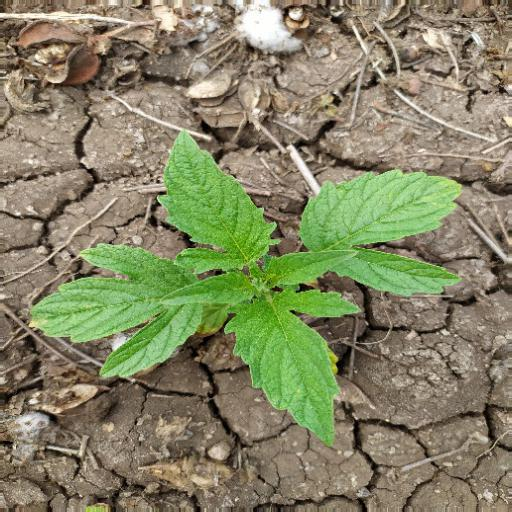

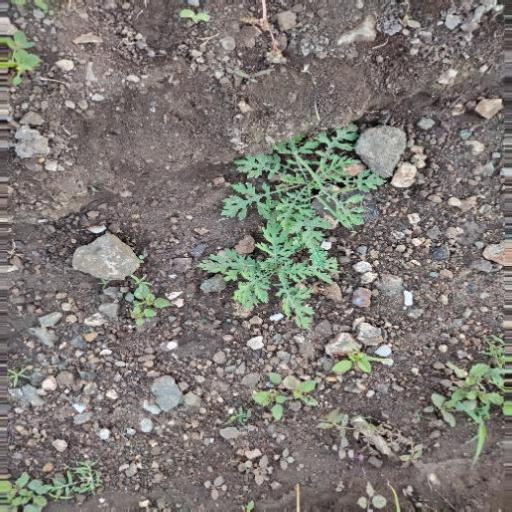

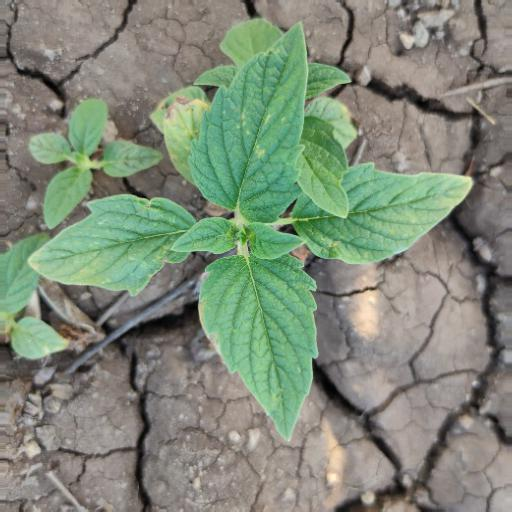

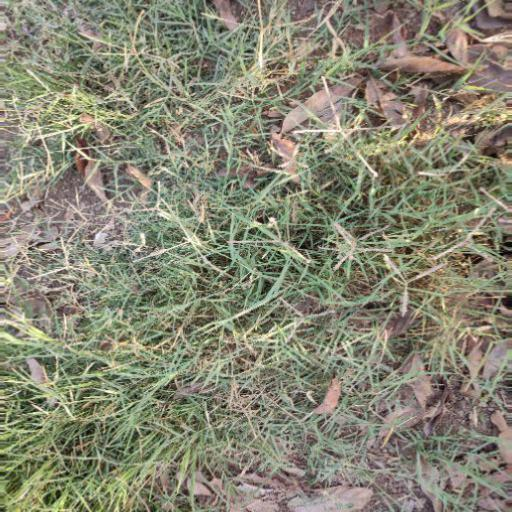

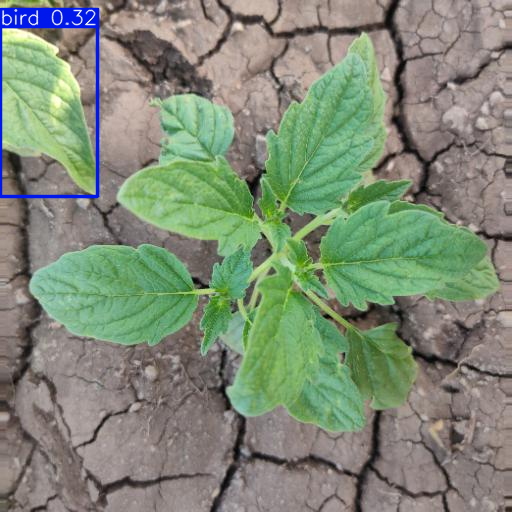

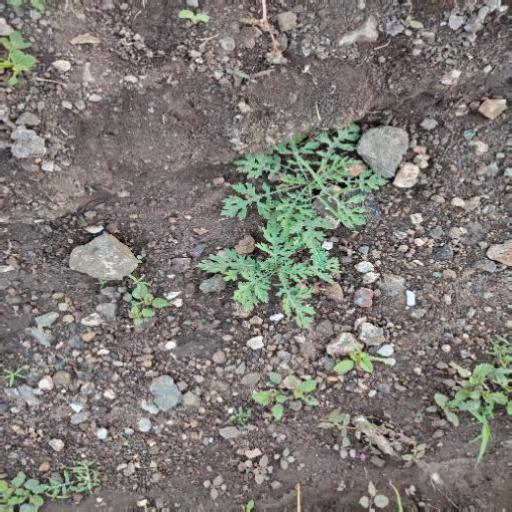

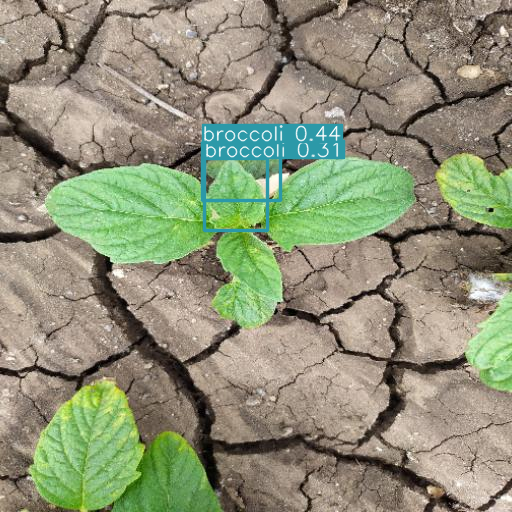

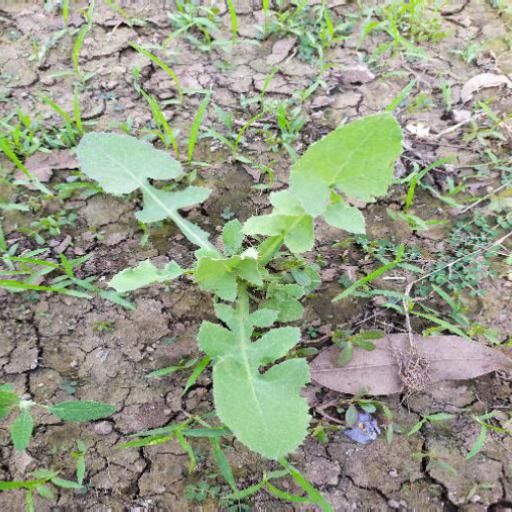

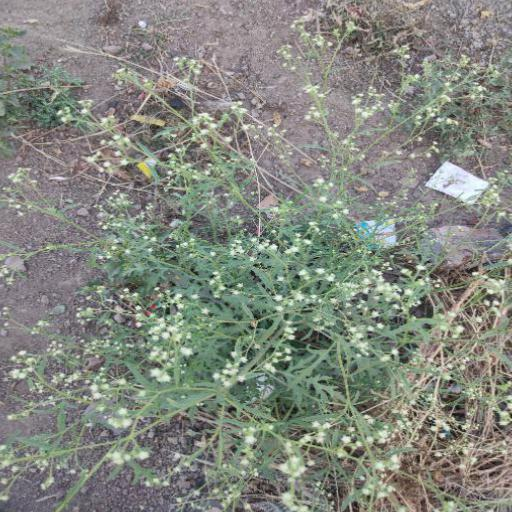

In [46]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

images = []

for file in os.scandir("CropWeedImages"):
    images.append(file.path)

results = model(images)

results.print()
results.show()

## Part C: Retraining ResNet18 to Differentiate Skulls

Retrained using the image set found at https://www.kaggle.com/datasets/karimabdulnabi/images-of-human-skulls-horses-and-lions

Code used for retraining was modified from the pytorch tutorial found at https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html

### Prepare data and labels for training based on directories

In [48]:
plt.ion()

data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'archive'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Function to randomly select and attempt to identify several images from the validation set

In [73]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                img = inputs.cpu().data[j]
                plt.imshow(img[1])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

### Function to retrain the desired layer in the model

In [50]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  
            else:
                model.eval()   

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    model.load_state_dict(best_model_wts)
    return model

### Retrain model

In order to use transfer learning to identify skull types, we:
- Load the pretrained ResNet18 model
- Set all of its layers to be "untrainable"
- Add a new layer on the end that can be trained
- Set our loss function, optimizer, and scheduler for our new, ready-to-be-trained layer

In [52]:
model_conv = models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 3)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\adhar/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [02:23<00:00, 326kB/s] 


We then simply train the model on our image sets

In [53]:
model_conv = train_model(model_conv, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.9844 Acc: 0.5559
val Loss: 0.5518 Acc: 0.7348

Epoch 1/24
----------
train Loss: 0.8757 Acc: 0.6337
val Loss: 0.5751 Acc: 0.7739

Epoch 2/24
----------
train Loss: 0.8757 Acc: 0.6393
val Loss: 0.4661 Acc: 0.8130

Epoch 3/24
----------
train Loss: 0.7596 Acc: 0.6832
val Loss: 0.3716 Acc: 0.8435

Epoch 4/24
----------
train Loss: 0.7912 Acc: 0.6704
val Loss: 0.5597 Acc: 0.7652

Epoch 5/24
----------
train Loss: 0.8602 Acc: 0.6832
val Loss: 0.2325 Acc: 0.9304

Epoch 6/24
----------
train Loss: 0.8484 Acc: 0.6563
val Loss: 0.2478 Acc: 0.9261

Epoch 7/24
----------
train Loss: 0.5965 Acc: 0.7553
val Loss: 0.3003 Acc: 0.8957

Epoch 8/24
----------
train Loss: 0.5927 Acc: 0.7412
val Loss: 0.2459 Acc: 0.9217

Epoch 9/24
----------
train Loss: 0.6426 Acc: 0.7468
val Loss: 0.2770 Acc: 0.9087

Epoch 10/24
----------
train Loss: 0.6375 Acc: 0.7426
val Loss: 0.2344 Acc: 0.9130

Epoch 11/24
----------
train Loss: 0.6202 Acc: 0.7553
val Loss: 0.2466 Acc: 0.9087

Ep

As can be seen, there is noticeable improvement resulting from our training. The high validation accuracy is a good indication of the success of the transfer learning.

### Display Results

Just some example identifications showing the success of the model.

Sorry the images are wonky, I couldn't get the rgb to go back together correctly.

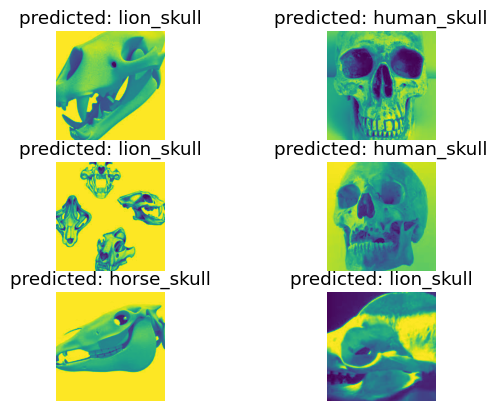

In [75]:
visualize_model(model_conv)

plt.ioff()
plt.show()